## Final Project Submission

Please fill out:
* Student name: Steven Shoemaker
* Student pace: Self Paced
* Scheduled project review date/time: 
* Instructor name: 
* Blog post URL:https://stevenshoemaker.net/portfolio/seattle-housing-project/


In [41]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
import reverse_geocoder as rg
import warnings
warnings.simplefilter("ignore")
from quilt.data.ResidentMario import missingno_data
import missingno as msno
import plotly.express as px
sns.set()

# Importing the necessary libraries. 

In [42]:
data = pd.read_csv("kc_house_data.csv")
data.drop(columns='id', inplace=True)

# EDA
#### I needed to get an understanding of the data before I could start working with it. In this section, you'll see some of exploration and processing that I did to get a handle on the data.

In [43]:
data.info() # Getting an idea about what types of data I'm dealing with. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(10), object(2)
memory usage: 3.3+ MB


## Visual of Missing Data
#### Let's check for and solve for any missing data. 

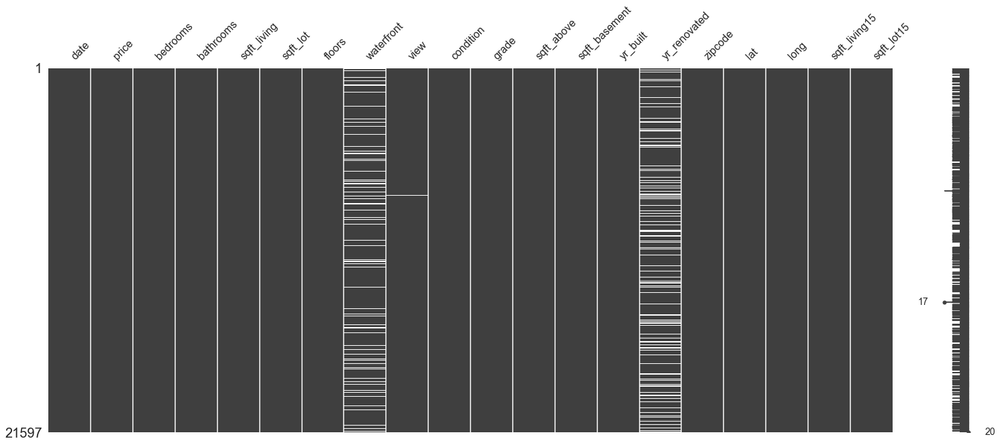

In [44]:
# This library called missingno is extremely helpful because it allows you to see at a glance if there is any missing data. 
msno.matrix(data) 

In [45]:
data["waterfront"].isna().sum() # That's a lot of missing values. A little more than 10% of the data. 

2376

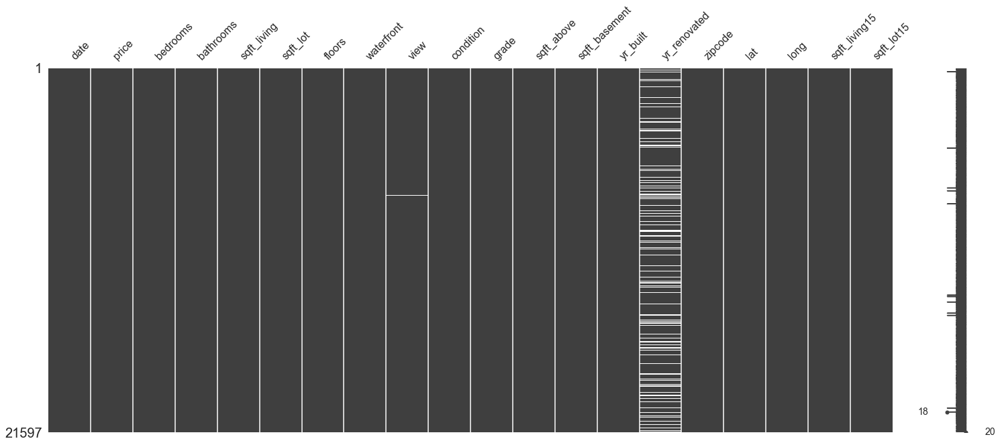

In [46]:
# Here I'm filling all the missing waterfront data with zeroes.
# Why? Well, common sense would say the majority of King County homes are not on the water. 
data["waterfront"].fillna(0,inplace=True) 
msno.matrix(data)

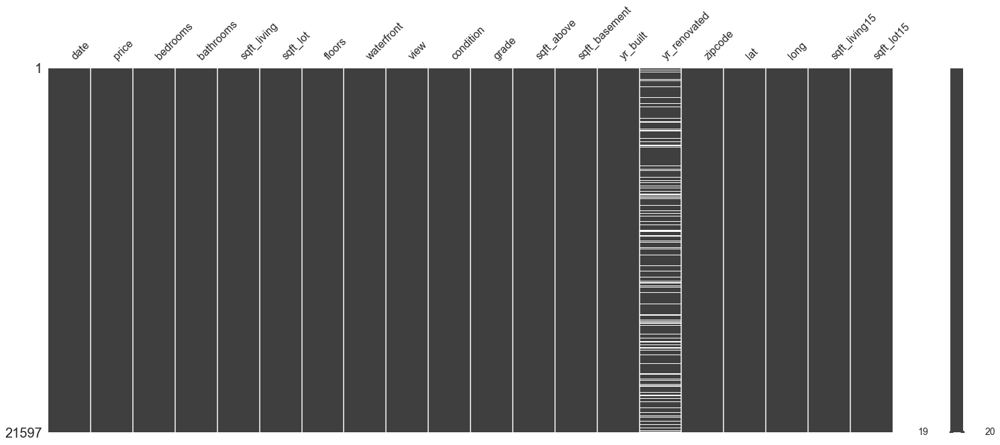

In [47]:
data['view'].fillna(0, inplace=True) # Barely anything is missing from here, I'll just fill it in with 0. 
msno.matrix(data)

In [48]:
data['yr_renovated'].value_counts() 
# From this, we can deduce that if the house has not been rennovated it is given a '0'

0.0       17011
2014.0       73
2003.0       31
2013.0       31
2007.0       30
          ...  
1946.0        1
1959.0        1
1971.0        1
1951.0        1
1954.0        1
Name: yr_renovated, Length: 70, dtype: int64

In [49]:
data['yr_renovated'].isna().sum() 
# Nearly 3900 homes have null values, I don't want to drop them because they are still valuable.

3842

In [50]:
data['yr_renovated'].fillna(0, inplace=True) # Replace the null values with 0, which seems to mean they haven't been renovated
data['yr_renovated'].isna().sum()

0

In [51]:
data.isnull().sum() #No null values! 

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

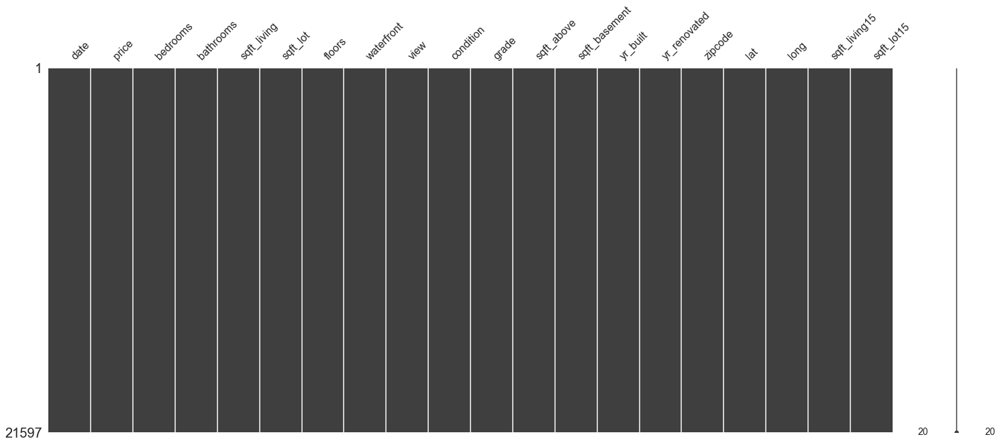

In [52]:
msno.matrix(data) # Data is looking pretty clean! 

## Dealing with Weird Values
#### I have my suspicion that some of the values here are weird. Let's take a look. 

In [53]:
data['sqft_basement'].value_counts() 
# Earlier, I saw that this was an 'object' type.
# This should be an int type, so let's investigate. 

0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
1525.0        1
207.0         1
1798.0        1
506.0         1
276.0         1
Name: sqft_basement, Length: 304, dtype: int64

In [54]:
data['sqft_basement'].replace('?',0, inplace=True) # Replacing those '?' with a 0. 
data['sqft_basement'] = data['sqft_basement'].astype(float) # Change to float
data['sqft_basement'] = data['sqft_basement'].apply(int) # Change to int


## Basic Understanding of Data
#### Next, let's take a look at the data via a couple of visualizations and see what we can make of it.

In [129]:
prices= data['price']

# Minimum price of the data
minimum_price = np.amin(prices)

# Maximum price of the data
maximum_price = np.amax(prices)

# Mean price of the data
mean_price = np.mean(prices)

# Median price of the data
median_price = np.median(prices)

# Standard deviation of prices of the data
std_price = np.std(prices)

# Show the calculated statistics
print("Statistics for King County housing dataset:\n")
print("Minimum price: ${}".format(minimum_price)) 
print("Maximum price: ${}".format(maximum_price))
print("Mean price: ${}".format(mean_price))
print("Median price ${}".format(median_price))
print("Standard deviation of prices: ${}".format(std_price))

grade= data['grade']

# Minimum grade of the data
minimum_grade = np.amin(grade)

# Maximum grade of the data
maximum_grade = np.amax(grade)

# Mean grade of the data
mean_grade = np.mean(grade)

# Median grade of the data
median_grade = np.median(grade)

# Standard deviation of grade of the data
std_grade = np.std(grade)

# Show the calculated statistics
print("Statistics for King County housing dataset:\n")
print("Minimum grade: {}".format(minimum_grade)) 
print("Maximum grade: {}".format(maximum_grade))
print("Mean grade: {}".format(mean_grade))
print("Median grade {}".format(median_grade))
print("Standard deviation of grade: {}".format(std_grade))

Statistics for King County housing dataset:

Minimum price: $78000.0
Maximum price: $7700000.0
Mean price: $540296.5735055795
Median price $450000.0
Standard deviation of prices: $367359.63492954714
Statistics for King County housing dataset:

Minimum grade: 3
Maximum grade: 13
Mean grade: 7.657915451220076
Median grade 7.0
Standard deviation of grade: 1.1731725022893438


#### Understanding KC grading Scale 

1-3 Falls short of minimum building standards. Normally cabin or inferior structure.

4 Generally older, low quality construction. Does not meet code.

5 Low construction costs and workmanship. Small, simple design.

6 Lowest grade currently meeting building code. Low quality materials and simple designs.

7 Average grade of construction and design. Commonly seen in plats and older sub-divisions.

8 Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

9 Better architectural design with extra interior and exterior design and quality.

10 Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.

11 Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.

12 Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.

13 Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.

## Exploring Price & Other Variables

Skew is: 4.023364652271239


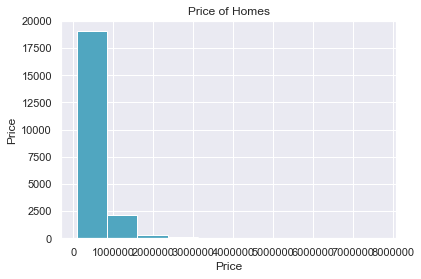

In [132]:
print ("Skew is:", data.price.skew())
plt.hist(data.price, color="#50a6c0") # Determining the skew of the price and plotting to histogram. 
plt.title("Price of Homes")
plt.xlabel("Price")
plt.ylabel("Price")
plt.show() #Looks pretty heavily skewed. This means there are a lot of cheaper homes. 

Skew is: 0.4310041773299232


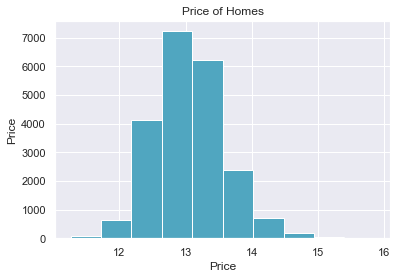

In [133]:
data['pricelog'] = np.log(data.price) # Normalizing the price to correct the skewness by using a log transformation. 
print ("Skew is:", data['pricelog'].skew())
plt.hist(data['pricelog'] , color="#50a6c0") # Determining the skew of the target variable and plotting to histogram. 
plt.title("Price of Homes")
plt.xlabel("Price")
plt.ylabel("Price")
plt.show()

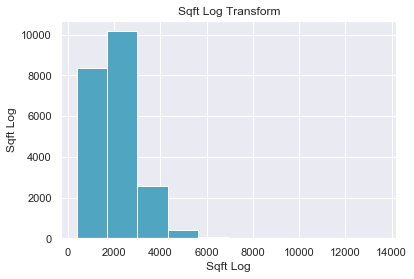

In [134]:
plt.hist(data.sqft_living, color="#50a6c0") # Determining the skew of the sqft variable and plotting to histogram. 
plt.title("Sqft Log Transform")
plt.xlabel("Sqft Log")
plt.ylabel("Sqft Log")
plt.show()

Skew is: -0.02736196977684956


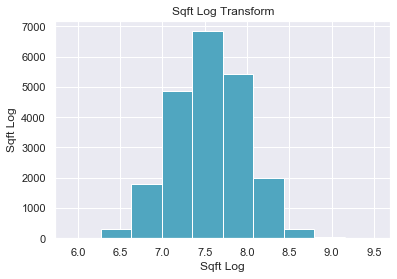

In [135]:
data['logsqft'] = np.log(data.sqft_living) # Normalizing the price to correct the skewness by using a log transformation. 
print ("Skew is:", data['logsqft'].skew())
plt.hist(data['logsqft'], color="#50a6c0") # Determining the skew of the sqft variable and plotting to histogram. 
plt.title("Sqft Log Transform")
plt.xlabel("Sqft Log")
plt.ylabel("Sqft Log")
plt.show()

### Housing Map

#### I figured this would be an interesting visualization for the final product - a simple visual showing the housing prices in King County so you can see areas of concentration and to highlight for the sellers that location does matter.

In [60]:
# Below is a visual made with the plotly express library, which primarily works on 'tidy data'. It's also beautiful.
px.set_mapbox_access_token("pk.eyJ1IjoidGFjdGljc2FuZHN0cmF0cyIsImEiOiJjazRqMmJsanMxaThvM2RvYjY4NmxzN2VnIn0.wN1Rkt4vWKKDdyAZSO3M6Q")
fig = px.scatter_mapbox(data, lat="lat", lon="long",    
                        color="price",
                        color_continuous_scale=px.colors.carto.Teal, 
                        size_max=15, 
                        zoom=10, 
                        height=1000, 
                        width=800, 
                        range_color=[300000,1000000],
                        labels = {"price":"House Price"}
                       )
fig.update_layout(title_text="King County Housing Prices")
fig.show()

### That's better - let's explore a couple more variables. 

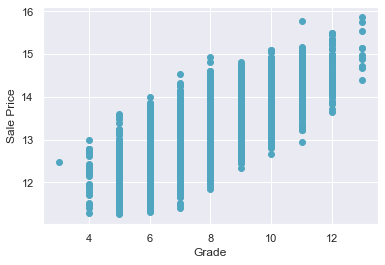

In [138]:
plt.scatter(x=data['grade'], y=data['pricelog'], color="#50a6c0")
plt.xlabel("Grade")
plt.ylabel("Sale Price")
plt.show()
#As the grade increases, so does the price. 
#Also, this looks categorical - let's set it aside for binning later. 

In [63]:
data['psqft'] = data.price/data.sqft_living # Creating a variable for price per square foot. 

## Question: How does the square footage effect the price of the home? 

In [64]:
fig = px.scatter(data, x=data['logsqft'], y=data['pricelog'],  
                 color=data['pricelog'], 
                 color_continuous_scale=px.colors.cmocean.ice, # Colors can be found in plotly documentation
                 height=700, 
                 width=1500,
                 title = "King County Prices",
                 labels = {"pricelog":"Price"}
               )
fig.update_xaxes(title="Square Footage")
fig.update_yaxes(title="Price", col=1)

fig.show()
# As the square feet increases, so does the price generally. 

### Result: Generally there is a high positive correlation - as the square footage increases so does  the price. 

Text(0, 0.5, 'Sale Price')

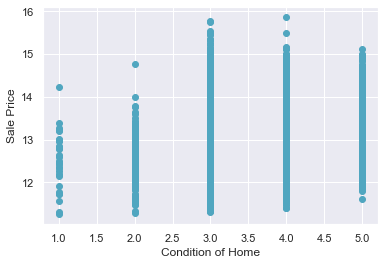

In [139]:
plt.scatter(x=data['condition'], y=data['pricelog'], color="#50a6c0")
plt.xlabel("Condition of Home")
plt.ylabel("Sale Price")
# As the condition of the home increases, so does the price. 
# Also, this looks categorical - let's set it aside for binning later. 

Text(0, 0.5, 'Sale Price')

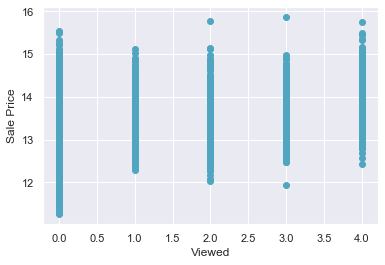

In [140]:
plt.scatter(x=data['view'], y=data['pricelog'], color="#50a6c0")
plt.xlabel("Viewed")
plt.ylabel("Sale Price")
# Another categorical

Text(0, 0.5, 'Sale Price')

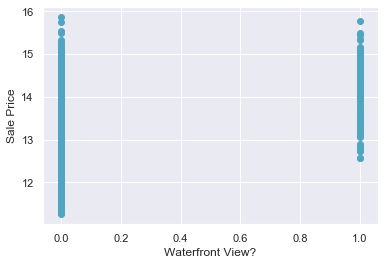

In [142]:
plt.scatter(x=data['waterfront'], y=data['pricelog'], color="#50a6c0")
plt.xlabel("Waterfront View?")
plt.ylabel("Sale Price")
# Another categorical

## Question: Will the city have an impact on the price? 

In [71]:
data['location'] = list(zip(data.lat,data.long))
tuple_array = tuple(data.location)
coordinates = tuple_array
#  Passing the locations from the data into the geocoder in the form of tuple. 

In [72]:
results = rg.search(coordinates) 
df = pd.DataFrame(results)
df.name.value_counts()
# Creating a dataframe with the results. 

Loading formatted geocoded file...


Seattle              2808
Shoreline            1815
White Center         1380
Lake Forest Park      628
City of Sammamish     617
                     ... 
Maltby                 13
Southworth             11
Maplewood              10
Tacoma                  5
Gig Harbor              4
Name: name, Length: 79, dtype: int64

In [73]:
data['neighborhood'] = df['name']
# Adding this to our data frame.

In [74]:
neighavg = data.groupby('neighborhood').mean()['psqft'].to_frame().reset_index() #Grouping the cities by mean sqft. 
neighavg

,neighborhood,psqft
0,Algona,146.290084
1,Ames Lake,244.419152
2,Auburn,150.553941
3,Bellevue,416.772830
4,Black Diamond,206.069234
...,...,...
74,West Lake Sammamish,299.710599
75,White Center,281.177489
76,Woodinville,243.203164
77,Woodway,275.640844


#### Quick Visual of the Neighborhood Prices

In [75]:
# Below is a visual made with the plotly express library, which primarily works on 'tidy data'. It's also beautiful.

fig = px.scatter(data, x=neighavg['neighborhood'], y=neighavg['psqft'], 
                 size=neighavg['psqft'], 
                 color=neighavg['psqft'], 
                 color_continuous_scale=px.colors.cmocean.ice, # Colors can be found in plotly documentation
                 height=700, 
                 width=1800,
                 range_color=[100,550], # I set the scale to capture a wide swath of the neighborhood prices. 
                 title = "King County Prices",
                 labels = {"color":"Price in $"}
               )
fig.update_xaxes(title="City")
fig.update_yaxes(title="Price per SqFt in $", col=1)

fig.show()

Text(0, 0.5, 'Sale Price')

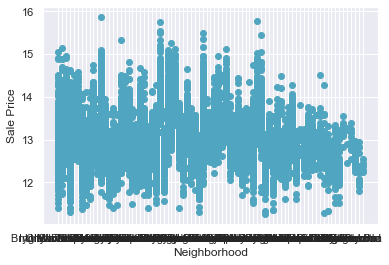

In [144]:
plt.scatter(x=data['neighborhood'], y=data['pricelog'], color="#50a6c0")
plt.xlabel("Neighborhood")
plt.ylabel("Sale Price")
# There seems to be a wide range of data here - let's consider this for later analysis. 
# Also, this looks categorical - let's set it aside for binning later. 

### Result: The Neighborhood can determine the variance in price has an effect on the overall price per squarefoot of the homes. 

## Correlation Matrix
#### This section will help me get a grasp on the data for my feature selection.

### Question: What items are most closely associated with price?

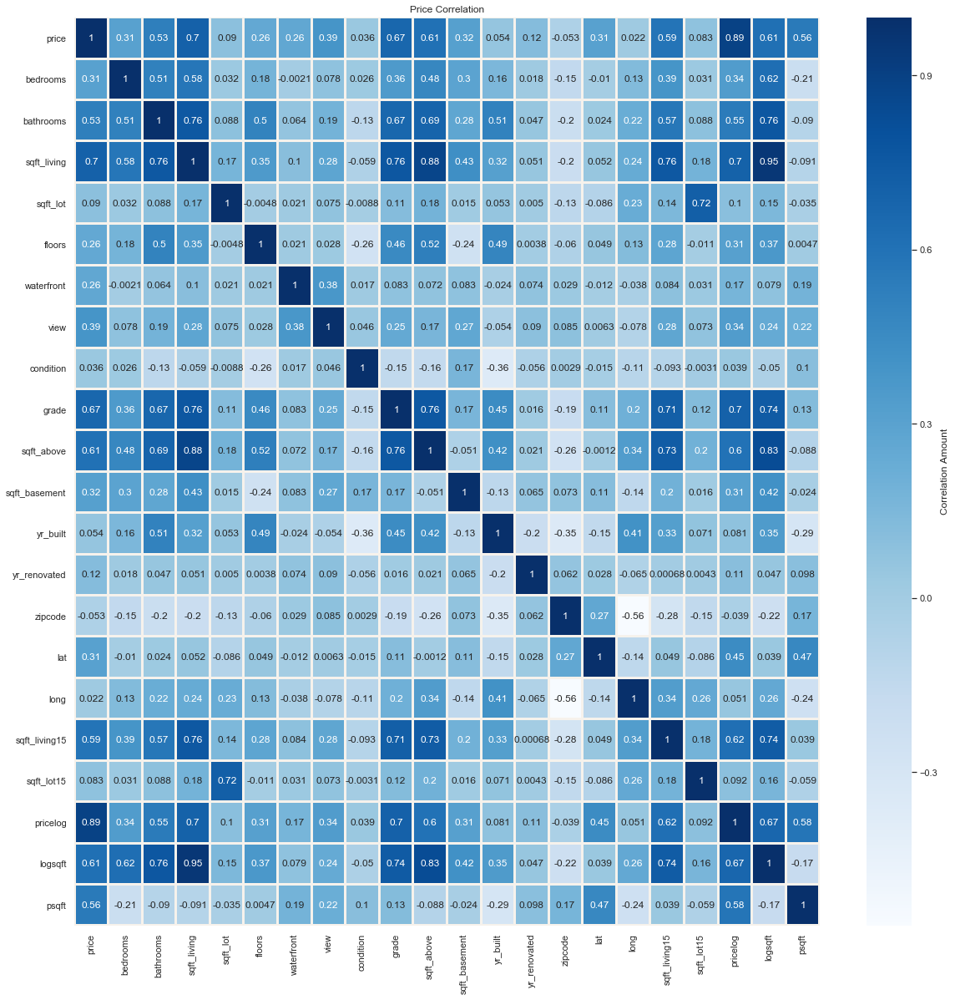

In [153]:
fig, ax = plt.subplots(figsize=(20,20)) #Just setting the figure size. 
sns.heatmap(data.corr(), ax=ax, annot=True, 
            cmap="Blues", 
            cbar_kws={'label': 'Correlation Amount'}, 
            linecolor="#F6F2EC", linewidth=2) 
ax.set_title("Price Correlation")
#Plotting the correlation map.
# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.show()

In [79]:
#Here I'm just looking for multicolinearity. From here I can avoid highly correlated values. 

data_pred = data.iloc[:,1:25]
data_pred.head()
abs(data_pred.corr()) > 0.70

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,pricelog,logsqft,psqft
price,True,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
bedrooms,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,True,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
sqft_living,True,False,True,True,False,False,False,False,False,True,...,False,False,False,False,False,True,False,False,True,False
sqft_lot,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
floors,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
grade,False,False,False,True,False,False,False,False,False,True,...,False,False,False,False,False,True,False,True,True,False


In [80]:
corr = data.corr() # Using the .corr method to get the correlation values
print(corr['price'].sort_values(ascending=False)[:5], '\n') # Top five values postively correlated
print(corr['price'].sort_values(ascending=False)[-5:]) # Bottom five values negatively correlated

price          1.000000
pricelog       0.891745
sqft_living    0.701917
grade          0.667951
logsqft        0.611839
Name: price, dtype: float64 

sqft_lot15    0.082845
yr_built      0.053953
condition     0.036056
long          0.022036
zipcode      -0.053402
Name: price, dtype: float64


### Result: Sqft_living, grade, are the most closely correlated items to the price of the home.

## Binning the Data
### I want to take the categorical values and bin them so we can do analysis. 

In [81]:
bedd = pd.get_dummies(data['bedrooms'], prefix="nbed")
graded = pd.get_dummies(data['grade'], prefix="ngrade")
neighd = pd.get_dummies(data['neighborhood'], prefix="nneigh")
viewd = pd.get_dummies(data['view'], prefix="nview")
waterfrontd = pd.get_dummies(data['waterfront'], prefix="nwater")
conditiond = pd.get_dummies(data['condition'], prefix="ncond")

# Reminder, our logs are pricelog and logsqft

## Feature Selection & Regression Tests

### My methodology for feature selection will be this: Test my hypothesis, run a regression, use stepwise_selection to help me parse out which features to keep, and then compile for final model for the test.

In [82]:
# Creating the stepwise function

import statsmodels.api as sm

def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out = 0.05, 
                       verbose=True):
    """ Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.argmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

### Test 1 - For Test 1, I went with some simple speculation on features. Trying out sqft_living and bedrooms. This is my 'common sense test'.

In [98]:
test_1 =pd.concat([data, bedd], axis=1, sort=False) # Adding Binned data. 
test_1

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,nbed_3,nbed_4,nbed_5,nbed_6,nbed_7,nbed_8,nbed_9,nbed_10,nbed_11,nbed_33
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,...,1,0,0,0,0,0,0,0,0,0
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,...,1,0,0,0,0,0,0,0,0,0
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,...,0,0,0,0,0,0,0,0,0,0
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,...,0,1,0,0,0,0,0,0,0,0
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,3,...,1,0,0,0,0,0,0,0,0,0
21593,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,3,...,0,1,0,0,0,0,0,0,0,0
21594,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,3,...,0,0,0,0,0,0,0,0,0,0
21595,1/16/2015,400000.0,3,2.50,1600,2388,2.0,0.0,0.0,3,...,1,0,0,0,0,0,0,0,0,0


In [99]:
y = test_1['pricelog']
x1 = test_1[['logsqft', 'nbed_1', 'nbed_2', 'nbed_3', 'nbed_4',
       'nbed_5', 'nbed_6', 'nbed_7', 'nbed_8', 'nbed_9', 'nbed_10', 'nbed_11',
       'nbed_33']]
X=x1 # Will be using this variable later for the stepwise. 


In [100]:
x = sm.add_constant(x1)
results = sm.OLS(y,x).fit()
results.summary()

# Running the OLS Regression

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               pricelog   R-squared:                       0.477
Model:                            OLS   Adj. R-squared:                  0.477
Method:                 Least Squares   F-statistic:                     1642.
Date:                Sat, 01 Feb 2020   Prob (F-statistic):               0.00
Time:                        12:37:35   Log-Likelihood:                -9787.2
No. Observations:               21597   AIC:                         1.960e+04
Df Residuals:                   21584   BIC:                         1.970e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.2915      0.075     70.510      0.000       5.144       5.439
logsqft        0.9702      0.008    119.531      0.000       0.954       0.986
nbed_1         0.7608      0.054     14.171      0.000       0.656       0.866
nbed_2         0.6537      0.048     13.668      0.000       0.560       0.747
nbed_3         0.4213      0.048      8.863      0.000       0.328       0.514
nbed_4         0.3658      0.048      7.652      0.000       0.272       0.460
nbed_5         0.3677      0.049      7.568      0.000       0.272       0.463
nbed_6         0.3157      0.052      6.029      0.000       0.213       0.418
nbed_7         0.2980      0.074      4.003      0.000       0.152       0.444
nbed_8         0.4150      0.108      3.829      0.000       0.203       0.627
nbed_9         0.3517      0.151      2.331      0.020       0.056       0.647
nbed_10        0.3319      0.208      1.597      0.110      -0.076       0.739
nbed_11        0.1022      0.354      0.289      0.773      -0.591       0.795
nbed_33        0.9076      0.353      2.568      0.010       0.215       1.600
==============================================================================
Omnibus:                       68.044   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               64.625
Skew:                           0.109   Prob(JB):                     9.27e-15
Kurtosis:                       2.845   Cond. No.                     1.54e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.31e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [101]:
result = stepwise_selection(X, test_1.pricelog, verbose=True) # Running Stepwise
print('resulting features:')
print(result)

Add  logsqft                        with p-value 0.0
Add  nbed_2                         with p-value 9.02771e-146
Add  nbed_1                         with p-value 2.73046e-32
Add  nbed_3                         with p-value 1.71804e-18
resulting features:
['logsqft', 'nbed_2', 'nbed_1', 'nbed_3']


In [102]:
y = test_1['pricelog']
X = test_1[['logsqft', 'nbed_2', 'nbed_1', 'nbed_3']]
# Using the features grabbed from stepwise. 

In [103]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Splitting into tests. 

In [104]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train)

y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)
# Performing regression. 

In [105]:
linreg.score(X_test,y_test)
# Getting the score. 

0.4727302282301053

In [106]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, linreg.predict(X_test))
rmse = np.sqrt(mse)
print("The RMSE of this model is {}".format(rmse))
# Getting the amount of margin. 

The RMSE of this model is 0.3789499378441843


## Result: This model is not very accurate even though it makes the most sense to a lot of home buyers. We need to dig deeper.

### Test 2 - I have decided on sqft_living, grade, view, and the condition grade of the property . All the other highly correlated potential features seemed to increase via common sense and to avoid overfitting I decided to keep things simple. 

In [107]:
test_2 =pd.concat([data, graded, viewd, conditiond], axis=1, sort=False)

In [108]:
y = test_2['pricelog']
x1 = test_2[['logsqft', 'ngrade_3', 'ngrade_4', 'ngrade_5',
       'ngrade_6', 'ngrade_7', 'ngrade_8', 'ngrade_9', 'ngrade_10',
       'ngrade_11', 'ngrade_12', 'ngrade_13', 'nview_0.0', 'nview_1.0',
       'nview_2.0', 'nview_3.0', 'nview_4.0','ncond_1', 'ncond_2',
       'ncond_3', 'ncond_4', 'ncond_5']]
X=x1 # Will be using this variable later for the stepwise. 

In [109]:
x = sm.add_constant(x1)
results = sm.OLS(y,x).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               pricelog   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.588
Method:                 Least Squares   F-statistic:                     1622.
Date:                Sat, 01 Feb 2020   Prob (F-statistic):               0.00
Time:                        12:37:57   Log-Likelihood:                -7211.3
No. Observations:               21597   AIC:                         1.446e+04
Df Residuals:                   21577   BIC:                         1.462e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.0888      0.049    146.102      0.000       6.994       7.184
logsqft        0.3821      0.008     46.431      0.000       0.366       0.398
ngrade_3       0.2120      0.310      0.685      0.493      -0.395       0.819
ngrade_4      -0.0135      0.067     -0.201      0.841      -0.145       0.118
ngrade_5      -0.0116      0.037     -0.316      0.752      -0.084       0.060
ngrade_6       0.1364      0.032      4.322      0.000       0.075       0.198
ngrade_7       0.2984      0.031      9.603      0.000       0.237       0.359
ngrade_8       0.4942      0.031     15.754      0.000       0.433       0.556
ngrade_9       0.7268      0.032     22.651      0.000       0.664       0.790
ngrade_10      0.9422      0.033     28.384      0.000       0.877       1.007
ngrade_11      1.1519      0.036     32.074      0.000       1.081       1.222
ngrade_12      1.3828      0.047     29.732      0.000       1.292       1.474
ngrade_13      1.7691      0.092     19.237      0.000       1.589       1.949
nview_0.0      1.1874      0.011    107.201      0.000       1.166       1.209
nview_1.0      1.4371      0.019     76.222      0.000       1.400       1.474
nview_2.0      1.3621      0.014     95.521      0.000       1.334       1.390
nview_3.0      1.4195      0.017     85.109      0.000       1.387       1.452
nview_4.0      1.6827      0.019     87.728      0.000       1.645       1.720
ncond_1        1.3609      0.053     25.574      0.000       1.257       1.465
ncond_2        1.2824      0.026     49.672      0.000       1.232       1.333
ncond_3        1.3869      0.016     88.941      0.000       1.356       1.417
ncond_4        1.4601      0.016     91.765      0.000       1.429       1.491
ncond_5        1.5986      0.017     94.063      0.000       1.565       1.632
==============================================================================
Omnibus:                       27.960   Durbin-Watson:                   1.971
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               26.492
Skew:                           0.062   Prob(JB):                     1.77e-06
Kurtosis:                       2.881   Cond. No.                     2.18e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.71e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [110]:
result = stepwise_selection(X, test_2['pricelog'], verbose=True)
print('resulting features:')
print(result)

Add  ngrade_11                      with p-value 0.0
Add  ngrade_6                       with p-value 0.0
Add  ngrade_10                      with p-value 0.0
Add  ngrade_7                       with p-value 0.0
Add  logsqft                        with p-value 0.0
Add  nview_0.0                      with p-value 1.37263e-230
Add  ngrade_9                       with p-value 2.53599e-113
Add  ngrade_12                      with p-value 1.49677e-109
Add  ncond_5                        with p-value 7.63544e-93
Add  ngrade_5                       with p-value 2.54338e-90
Add  nview_4.0                      with p-value 1.62121e-47
Add  ncond_4                        with p-value 2.81736e-41
Add  ngrade_13                      with p-value 2.2074e-40
Add  ngrade_8                       with p-value 2.92655e-15
Drop ngrade_5                       with p-value 0.991975
Add  nview_2.0                      with p-value 6.30089e-05
Add  ncond_2                        with p-value 7.20954e-05
resu

In [111]:
y = test_2['pricelog']
X = test_2[['ngrade_11', 'ngrade_6', 'ngrade_10', 'ngrade_7', 'logsqft', 'nview_0.0', 'ngrade_9', 'ngrade_12', 
            'ncond_5', 'nview_4.0', 'ncond_4', 'ngrade_13', 'ngrade_8', 'nview_2.0', 'ncond_2']]
# Using the features grabbed from stepwise. 

In [112]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Splitting into tests.

In [113]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train)

y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)
# Performing regression. 

In [114]:
linreg.score(X_test,y_test)
# Getting the score. 

0.5853449514027792

In [115]:
from sklearn import metrics
mse = mean_squared_error(y_test, linreg.predict(X_test))
rmse = np.sqrt(mse)
print("The RMSE of this model is {}".format(rmse))

The RMSE of this model is 0.3360538551157143


## Result: The model has improved but we still have some other features we can evaluate for increased accuracy.

## Test 3
### For my final test I have decided on sqft_living, grade, view, condition, city, and whether or not it has a waterfront view. This is my most speculative hypothesis after reviewing all the data.

In [116]:
test_3 =pd.concat([data, graded, viewd, conditiond, neighd, waterfrontd, bedd], axis=1, sort=False) # Adding binned data

In [117]:
y = test_3['pricelog']
x1 = test_3[['logsqft',
 'ngrade_3', 'ngrade_4', 'ngrade_5', 'ngrade_6' 'ngrade_7', 'ngrade_8', 'ngrade_9','ngrade_10','ngrade_11','ngrade_12',
 'ngrade_13','nview_0.0','nview_1.0','nview_2.0','nview_3.0','nview_4.0','ncond_1','ncond_2','ncond_3','ncond_4','ncond_5',
 'nneigh_Algona','nneigh_Ames Lake','nneigh_Auburn','nneigh_Bellevue','nneigh_Black Diamond','nneigh_Bothell','nneigh_Boulevard Park',
 'nneigh_Brier','nneigh_Bryn Mawr-Skyway','nneigh_Buckley','nneigh_Burien','nneigh_Carnation','nneigh_City of Sammamish',
 'nneigh_Clyde Hill','nneigh_Cottage Lake','nneigh_Covington','nneigh_Des Moines','nneigh_Duvall','nneigh_East Hill-Meridian',
 'nneigh_East Renton Highlands','nneigh_Eastgate','nneigh_Edgewood','nneigh_Enumclaw','nneigh_Esperance','nneigh_Fairwood',
 'nneigh_Fall City','nneigh_Federal Way','nneigh_Fife Heights','nneigh_Gig Harbor','nneigh_Gold Bar','nneigh_Hobart',
 'nneigh_Inglewood-Finn Hill','nneigh_Issaquah','nneigh_Kenmore','nneigh_Kent','nneigh_Kingsgate','nneigh_Kirkland',
 'nneigh_Klahanie','nneigh_Lake Forest Park','nneigh_Lake Marcel-Stillwater','nneigh_Lake Morton-Berrydale','nneigh_Lakeland North',
 'nneigh_Lakeland South','nneigh_Lea Hill','nneigh_Maltby','nneigh_Maple Heights-Lake Desire','nneigh_Maple Valley',
 'nneigh_Maplewood','nneigh_Medina','nneigh_Mercer Island','nneigh_Milton','nneigh_Mirrormont','nneigh_Mountlake Terrace',
 'nneigh_Newcastle','nneigh_Newport','nneigh_Normandy Park','nneigh_North Bend','nneigh_Pacific','nneigh_Ravensdale',
 'nneigh_Redmond','nneigh_Renton','nneigh_Riverbend','nneigh_Riverton','nneigh_Sammamish','nneigh_SeaTac','nneigh_Shoreline',
 'nneigh_Snoqualmie','nneigh_Southworth','nneigh_Tacoma','nneigh_Tanner','nneigh_Tukwila','nneigh_Union Hill-Novelty Hill',
 'nneigh_Seattle','nneigh_Vashon','nneigh_West Lake Sammamish','nneigh_White Center','nneigh_Woodinville','nneigh_Woodway',
 'nneigh_Yarrow Point','nwater_0.0','nwater_1.0']]
X=x1# Will be using this variable later for the stepwise. X=x1 

In [118]:
x = sm.add_constant(x1)
results = sm.OLS(y,x).fit()
results.summary() # Running the regression

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               pricelog   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     1216.
Date:                Sat, 01 Feb 2020   Prob (F-statistic):               0.00
Time:                        12:39:06   Log-Likelihood:                 3488.9
No. Observations:               21597   AIC:                            -6780.
Df Residuals:                   21498   BIC:                            -5990.
Df Model:                          98                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                                4.9134      0.023    211.271      0.000       4.868       4.959
logsqft                              0.4792      0.005     91.966      0.000       0.469       0.489
ngrade_3                             0.6245      0.189      3.302      0.001       0.254       0.995
ngrade_4                             0.0367      0.041      0.890      0.374      -0.044       0.118
ngrade_5                             0.0207      0.023      0.905      0.365      -0.024       0.065
ngrade_6                             0.0686      0.020      3.485      0.000       0.030       0.107
ngrade_7                             0.1578      0.019      8.167      0.000       0.120       0.196
ngrade_8                             0.2655      0.019     13.649      0.000       0.227       0.304
ngrade_9                             0.4244      0.020     21.379      0.000       0.385       0.463
ngrade_10                            0.5646      0.021     27.507      0.000       0.524       0.605
ngrade_11                            0.7058      0.022     31.846      0.000       0.662       0.749
ngrade_12                            0.8877      0.029     31.044      0.000       0.832       0.944
ngrade_13                            1.1571      0.056     20.517      0.000       1.047       1.268
nview_0.0                            0.8223      0.006    128.957      0.000       0.810       0.835
nview_1.0                            0.9750      0.011     86.903      0.000       0.953       0.997
nview_2.0                            0.9562      0.008    115.377      0.000       0.940       0.972
nview_3.0                            1.0227      0.010    104.900      0.000       1.004       1.042
nview_4.0                            1.1371      0.012     91.740      0.000       1.113       1.161
ncond_1                              0.8094      0.032     25.203      0.000       0.746       0.872
ncond_2                              0.9097      0.015     58.990      0.000       0.879       0.940
ncond_3                              1.0060      0.009    110.985      0.000       0.988       1.024
ncond_4                              1.0640      0.009    115.003      0.000       1.046       1.082
ncond_5                              1.1243      0.010    112.729      0.000       1.105       1.144
nneigh_Algona                       -0.3427      0.032    -10.833      0.000      -0.405      -0.281
nneigh_Ames Lake                     0.2121      0.016     13.426      0.000       0.181       0.243
nneigh_Auburn                       -0.3476      0.016    -22.087      0.000      -0.378      -0.317
nneigh_Bellevue                      0.6758      0.015     45.011      0.000       0.646       0.705
nneigh_Black Diamond                -0.0649      0.02

In [119]:
result = stepwise_selection(X, test_3['price'], verbose=True)
print('resulting features:')
print(result)

Add  ngrade_11                      with p-value 0.0
Add  nview_4.0                      with p-value 0.0
Add  ngrade_12                      with p-value 0.0
Add  ngrade_9                       with p-value 0.0
Add  ngrade_13                      with p-value 0.0
Add  ngrade_10                      with p-value 0.0
Add  nneigh_Seattle                 with p-value 0.0
Add  logsqft                        with p-value 0.0
Add  nneigh_Medina                  with p-value 0.0
Add  nneigh_Clyde Hill              with p-value 9.31151e-210
Add  nneigh_Yarrow Point            with p-value 3.73602e-205
Add  nwater_0.0                     with p-value 2.73675e-198
Add  nneigh_Mercer Island           with p-value 5.17908e-169
Add  nneigh_Bellevue                with p-value 4.00538e-181
Add  nneigh_Shoreline               with p-value 5.62536e-147
Add  nneigh_Kirkland                with p-value 8.70003e-130
Add  nview_0.0                      with p-value 1.9629e-128
Add  nneigh_Newport         

In [120]:
y = test_3['pricelog']
X = test_3[['ngrade_11', 'nview_4.0', 'ngrade_12', 'ngrade_9', 'ngrade_13', 'ngrade_10', 'nneigh_Seattle', 'logsqft',
            'nneigh_Medina', 'nneigh_Clyde Hill', 'nneigh_Yarrow Point', 'nwater_0.0', 'nneigh_Mercer Island', 'nneigh_Bellevue',
            'nneigh_Shoreline', 'nneigh_Kirkland', 'nview_0.0', 'nneigh_Newport', 
            'nneigh_Inglewood-Finn Hill', 'nneigh_Redmond', 'nneigh_White Center', 'nneigh_Eastgate', 
            'nneigh_Lake Forest Park', 'nneigh_Union Hill-Novelty Hill', 'nneigh_Sammamish', 'nneigh_City of Sammamish', 
            'nneigh_Issaquah', 'nneigh_West Lake Sammamish', 'ncond_5', 'nneigh_Kingsgate', 'ngrade_8', 'nneigh_Federal Way', 
            'ncond_4', 'nneigh_Lea Hill', 'nneigh_Fife Heights', 'nwater_1.0', 'nview_3.0', 'nneigh_East Hill-Meridian', 
            'nneigh_Lakeland North', 'nneigh_Woodinville', 'nneigh_Cottage Lake', 'nneigh_Newcastle', 'nneigh_Fall City',
            'nneigh_Kenmore', 'nneigh_Covington', 'nneigh_Pacific', 'nneigh_Des Moines', 'nneigh_Auburn', 'nneigh_Enumclaw',
            'nneigh_Lake Morton-Berrydale', 'nneigh_Woodway', 'nneigh_Gig Harbor', 'nneigh_Maple Valley', 'nneigh_Ames Lake', 
            'nneigh_Kent', 'nneigh_Esperance', 'ngrade_4', 'nneigh_Maple Heights-Lake Desire', 'nneigh_Algona', 
            'nneigh_Fairwood', 'nneigh_Lakeland South', 'nneigh_Klahanie', 'nneigh_Ravensdale', 'nneigh_Maltby', 
            'ngrade_5', 'nneigh_Renton', 'nneigh_SeaTac', 'nneigh_Tukwila', 'nneigh_Edgewood', 'nneigh_Milton', 'nneigh_Burien']]
# Using the features grabbed from stepwise. 

In [121]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Splitting into tests.

In [122]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train)

y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)
# Performing regression. 

In [123]:
linreg.score(X_test,y_test)
# Getting the score. 

0.836013610807684

In [124]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, linreg.predict(X_test))
rmse = np.sqrt(mse)
print("The RMSE of this model is {}".format(rmse))

The RMSE of this model is 0.21133396671395624


## Result: This model has a high R^2 and will be used as our final model.

# Conclusion: 

#### The KC housing market can be explained fairly accurately by a few factors, namely the sqft_living, grade, view, condition, neighborhood, and whether or not it has a waterfront view. These are appropriate features for a potential buyer or seller to use to influence the selling price of their home. 

# Recommendations for Business:
## I have four recommendations for individuals interested in using these results:
### 1. Increase the size of your home if possible - there is an undeniable connection between the size of the home and the final value.
### 2. Improve the condition of your home -  Homes that are well maintained and in good condition generally have a higher price. 
### 3. Improve the grade of your home -  Renovating the interior of your home will improve the value and it is shown to have a positive correlation with price. 
### 4. Look at the City - for those interested in buying or selling their home the location matters to the long term value of the location. The closer to Seattle the better. 

Condition: Relative to Age and Grade

*1= Poor Many repairs needed. Showing serious deterioration.

*2= Fair Some repairs needed immediately. Much deferred maintenance.

*3= Average Depending upon age of improvement; normal amount of upkeep for the age
of the home.

*4= Good Condition above the norm for the age of the home. Indicates extra attention
and care has been taken to maintain.

*5= Very Good Excellent maintenance and updating on home. Not a total renovation

In [155]:
#Visual showing Condition improves price. 
fig = px.box(df, x=data['condition'], y=data['pricelog'],
                 title = "Condition of Home",
                  height=500, 
                  width=1400,
               )
fig.update_xaxes(title="Condition")
fig.update_yaxes(title="Price", col=1)
fig.show()

In [128]:
# Visual showing grade of home
fig = px.box(df, x=data['grade'], y=data['pricelog'],
                 title = "Grade of Homes",
                 height=500, 
                 width=1400, 
               )
fig.update_xaxes(title="Grade")
fig.update_yaxes(title="Price", col=1)
fig.show()